<a href="https://colab.research.google.com/github/Ajeypandey-eng/Logistic-Regression/blob/main/Logistic_Reg_handson.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/bank-additional-full (3) (1) (2) (1).csv",sep=';')

In [ ]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57.0,services,married,high.school,unknown,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37.0,services,married,high.school,no,yes,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40.0,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56.0,services,married,high.school,no,no,yes,telephone,may,mon,...,1.0,999.0,0.0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41194,74.0,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41195,74.0,NaN,married,professional.course,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41196,74.0,retired,married,NaN,no,yes,no,cellular,nov,fri,...,3.0,999.0,1.0,failure,-1.1,94.767,-50.8,1.028,4963.6,no
41197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(df.to_string())

        age            job   marital            education  default  housing     loan    contact month day_of_week  duration  campaign  pdays  previous     poutcome  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed    y
0      56.0      housemaid   married             basic.4y       no       no       no  telephone   may         mon     261.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
1      57.0       services   married          high.school  unknown       no       no  telephone   may         mon     149.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
2      37.0       services   married          high.school       no      yes       no  telephone   may         mon     226.0       1.0  999.0       0.0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
3      40.0         admin.   married            

In [ ]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41199 entries, 0 to 41198
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41195 non-null  float64
 1   job             41194 non-null  object 
 2   marital         41194 non-null  object 
 3   education       41194 non-null  object 
 4   default         41195 non-null  object 
 5   housing         41196 non-null  object 
 6   loan            41195 non-null  object 
 7   contact         41195 non-null  object 
 8   month           41196 non-null  object 
 9   day_of_week     41196 non-null  object 
 10  duration        41196 non-null  float64
 11  campaign        41196 non-null  float64
 12  pdays           41196 non-null  float64
 13  previous        41196 non-null  float64
 14  poutcome        41194 non-null  object 
 15  emp.var.rate    41196 non-null  float64
 16  cons.price.idx  41195 non-null  float64
 17  cons.conf.idx   41196 non-null 

In [ ]:
df.shape

(41199, 21)

In [ ]:
df.isnull().sum()

,0
age,4
job,5
marital,5
education,5
default,4
housing,3
loan,4
contact,4
month,3
day_of_week,3


In [ ]:
df.isnull().sum().sum()

np.int64(76)

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
housing,0
loan,0
contact,0
month,0
day_of_week,0


In [ ]:
df.duplicated().sum()

np.int64(13)

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

np.int64(0)

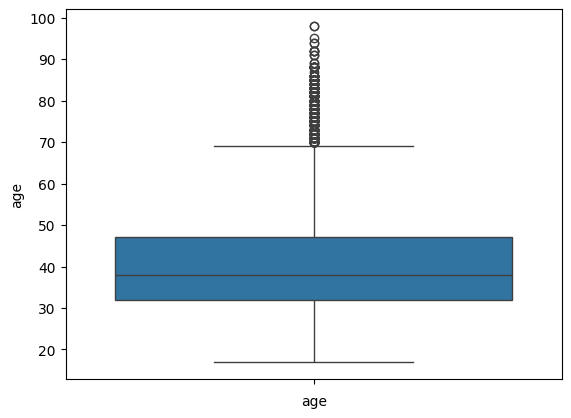

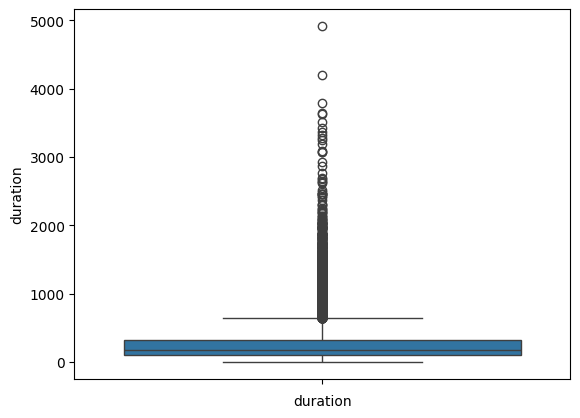

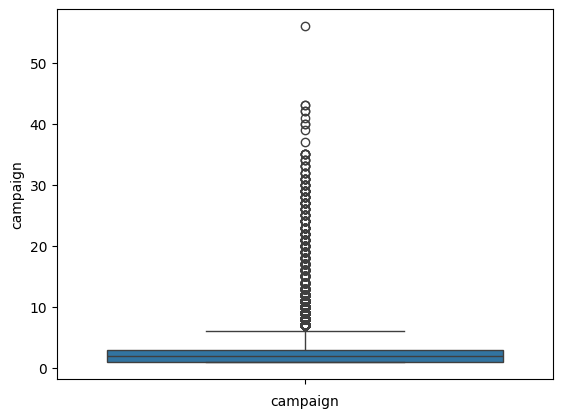

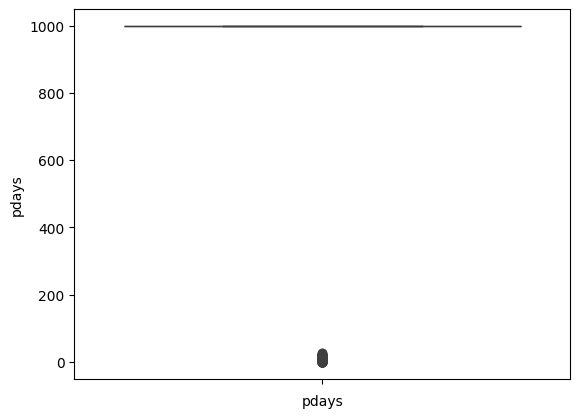

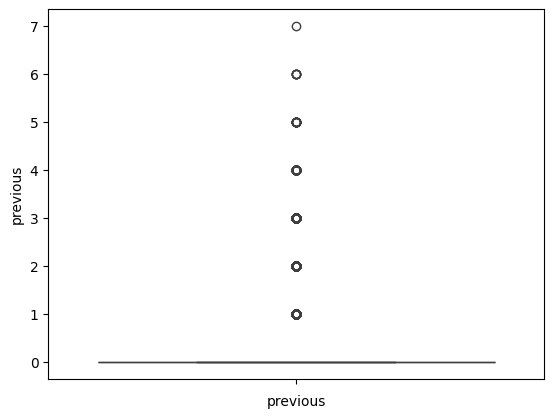

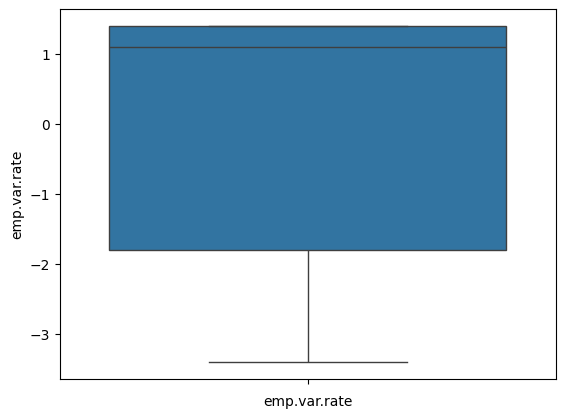

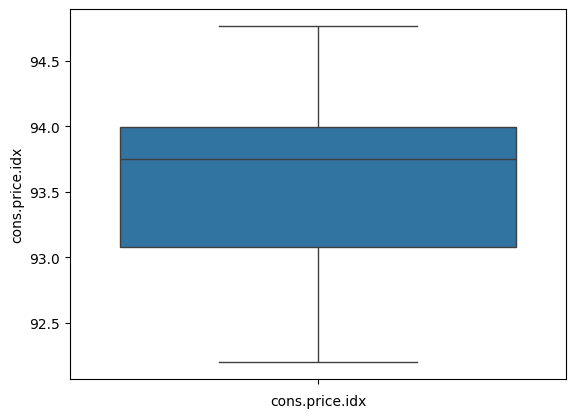

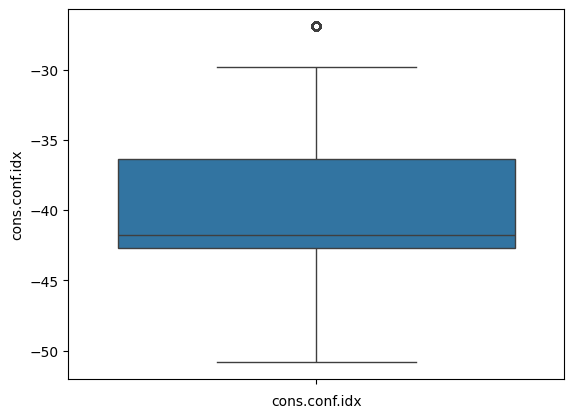

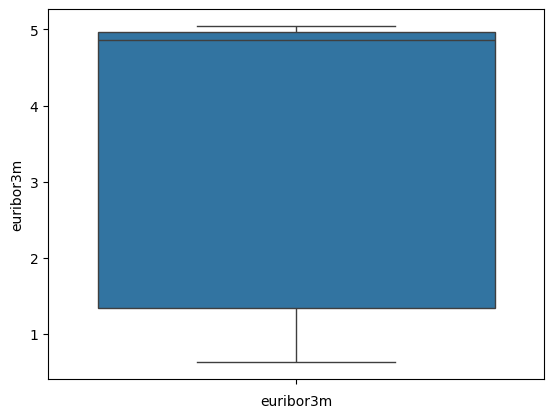

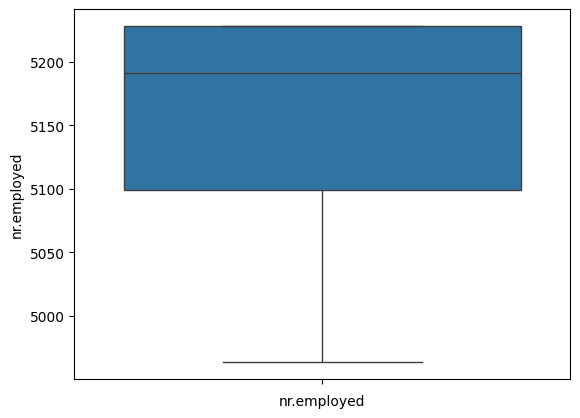

In [ ]:
for i in df.columns:
  if(df[i].dtypes=='int64' or df[i].dtypes=='float64'):
    sns.boxplot(df[i])
    plt.xlabel(i)
    plt.show()

In [ ]:
q1 = df['age'].quantile(0.25)
q3 = df['age'].quantile(0.75)
iqr = q3-q1
ub = q3+1.5*iqr
lb = q1-1.5*iqr
df = df[(df['age']<=ub) & (df['age']>=lb)]

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for col in df.columns:
  if df[col].dtypes == 'object':
    df[col] = le.fit_transform(df[col])

In [ ]:
df

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56.0,3,1,0,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
1,57.0,7,1,3,1,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
2,37.0,7,1,3,0,2,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
3,40.0,0,1,1,0,0,0,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
4,56.0,7,1,3,0,0,2,1,6,1,...,1.0,999.0,0.0,1,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41181,37.0,0,1,6,0,2,0,0,7,0,...,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,1
41182,29.0,10,2,0,0,2,0,0,7,0,...,1.0,9.0,1.0,2,-1.1,94.767,-50.8,1.028,4963.6,0
41184,46.0,1,1,5,0,0,0,0,7,0,...,1.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56.0,5,1,6,0,2,0,0,7,0,...,2.0,999.0,0.0,1,-1.1,94.767,-50.8,1.028,4963.6,0


  vif - variance inflation factor

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,22.008695
1,job,2.102466
2,marital,5.696930
3,education,4.541063
4,default,1.414062
5,housing,2.204812
6,loan,1.207929
7,contact,2.895702
8,month,6.859569
9,day_of_week,3.085333


In [ ]:
df = df.drop(['nr.employed'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,22.001523
1,job,2.102344
2,marital,5.696219
3,education,4.539936
4,default,1.411572
5,housing,2.204243
6,loan,1.207872
7,contact,2.419299
8,month,5.885668
9,day_of_week,3.084719


In [ ]:
df = df.drop(['cons.price.idx'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,20.884801
1,job,2.096720
2,marital,5.551134
3,education,4.488847
4,default,1.411549
5,housing,2.202931
6,loan,1.207514
7,contact,2.334296
8,month,5.844000
9,day_of_week,3.070582


In [ ]:
df = df.drop(['euribor3m'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,20.048194
1,job,2.095403
2,marital,5.516896
3,education,4.450055
4,default,1.411108
5,housing,2.201200
6,loan,1.207457
7,contact,2.328193
8,month,5.356861
9,day_of_week,3.060378


In [ ]:
df = df.drop(['cons.conf.idx'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,20.028630
1,job,2.094978
2,marital,5.494475
3,education,4.434766
4,default,1.410483
5,housing,2.199232
6,loan,1.206974
7,contact,2.249380
8,month,5.329290
9,day_of_week,3.060348


In [ ]:
df = df.drop(['pdays'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,age,10.480047
1,job,2.077954
2,marital,4.300444
3,education,4.169418
4,default,1.410063
5,housing,2.155087
6,loan,1.203200
7,contact,2.247593
8,month,4.956866
9,day_of_week,2.957926


In [ ]:
df = df.drop(['age'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,job,2.051052
1,marital,4.292230
2,education,3.959356
3,default,1.320413
4,housing,2.099733
5,loan,1.199467
6,contact,2.246672
7,month,4.623271
8,day_of_week,2.861624
9,duration,1.936515


In [ ]:
df = df.drop(['poutcome'],axis=1)

In [ ]:
col_list=[]
for i in df.columns:
  if ((df[i].dtype!='object')&(i!='y')):
    col_list.append(i)

x=df[col_list]
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

In [ ]:
vif_data

,feature,VIF
0,job,2.025672
1,marital,4.015588
2,education,3.677447
3,default,1.306457
4,housing,2.057718
5,loan,1.196779
6,contact,2.231946
7,month,4.429220
8,day_of_week,2.752649
9,duration,1.878750


In [ ]:
#RFE - Recursive feature elimanation

In [ ]:
x = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [ ]:
x

,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,previous,emp.var.rate
0,3,1,0,0,0,0,1,6,1,261.0,1.0,0.0,1.1
1,7,1,3,1,0,0,1,6,1,149.0,1.0,0.0,1.1
2,7,1,3,0,2,0,1,6,1,226.0,1.0,0.0,1.1
3,0,1,1,0,0,0,1,6,1,151.0,1.0,0.0,1.1
4,7,1,3,0,0,2,1,6,1,307.0,1.0,0.0,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
41181,0,1,6,0,2,0,0,7,0,281.0,1.0,0.0,-1.1
41182,10,2,0,0,2,0,0,7,0,112.0,1.0,1.0,-1.1
41184,1,1,5,0,0,0,0,7,0,383.0,1.0,0.0,-1.1
41185,5,1,6,0,2,0,0,7,0,189.0,2.0,0.0,-1.1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
41181,1
41182,0
41184,0
41185,0


In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression()

In [ ]:
from sklearn.feature_selection import RFE

In [ ]:
rfe = RFE(model)

In [ ]:
rfe.fit(x,y)

RFE(estimator=LogisticRegression())

In [ ]:
rfe.support_

array([False,  True,  True,  True, False, False,  True, False, False,
       False, False,  True,  True])

In [ ]:
selected_indices=[i for i, data in enumerate(rfe.support_) if data==True]

In [ ]:
selected_indices

[1, 2, 3, 6, 11, 12]

In [ ]:
column_name= x.columns

In [ ]:
selected_columns = [column_name[i] for i in selected_indices]

In [ ]:
selected_columns

['marital', 'education', 'default', 'contact', 'previous', 'emp.var.rate']

In [ ]:
x=x.loc[:,['marital', 'education', 'default', 'contact', 'previous', 'emp.var.rate']]

In [ ]:
x

,marital,education,default,contact,previous,emp.var.rate
0,1,0,0,1,0.0,1.1
1,1,3,1,1,0.0,1.1
2,1,3,0,1,0.0,1.1
3,1,1,0,1,0.0,1.1
4,1,3,0,1,0.0,1.1
...,...,...,...,...,...,...
41181,1,6,0,0,0.0,-1.1
41182,2,0,0,0,1.0,-1.1
41184,1,5,0,0,0.0,-1.1
41185,1,6,0,0,0.0,-1.1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
41181,1
41182,0
41184,0
41185,0


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [ ]:
x_train

,marital,education,default,contact,previous,emp.var.rate
29270,1,2,0,0,1.0,-1.8
11542,1,3,0,1,0.0,1.4
36570,2,6,1,0,1.0,-2.9
5158,1,0,1,1,0.0,1.1
13392,1,1,0,0,0.0,1.4
...,...,...,...,...,...,...
6266,1,2,0,1,0.0,1.1
11285,1,2,0,1,0.0,1.4
38380,1,5,0,0,2.0,-3.4
860,1,6,0,1,0.0,1.1


In [ ]:
y_train

,y
29270,0
11542,0
36570,0
5158,0
13392,0
...,...
6266,0
11285,0
38380,0
860,0


In [ ]:
x_test

,marital,education,default,contact,previous,emp.var.rate
5713,1,0,0,1,0.0,1.1
6947,2,3,0,1,0.0,1.1
29780,0,6,1,0,1.0,-1.8
18706,2,3,0,0,0.0,1.4
40891,1,5,0,0,2.0,-1.1
...,...,...,...,...,...,...
20397,1,6,0,0,0.0,1.4
33468,2,2,0,0,0.0,-1.8
35012,1,1,1,0,0.0,-1.8
34270,2,3,0,0,1.0,-1.8


In [ ]:
y_test

,y
5713,0
6947,0
29780,0
18706,0
40891,1
...,...
20397,0
33468,1
35012,0
34270,0


In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lr = LogisticRegression()

In [ ]:
lr.fit(x_train,y_train)

LogisticRegression()

In [ ]:
y_pred = lr.predict(x_test)

In [ ]:
new_df = pd.DataFrame({'Actual':y_test,'Predicted':y_pred})

In [ ]:
new_df

,Actual,Predicted
5713,0,0
6947,0,0
29780,0,0
18706,0,0
40891,1,0
...,...,...
20397,0,0
33468,1,0
35012,0,0
34270,0,0


In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [ ]:
accuracy_score(y_test,y_pred)*100

89.1918447555883